In [ ]:
import matplotlib.pyplot as plt
import torch
from torch import nn
from torch.utils.data import Dataset

from simulation.generate import generate_trajectory_data
from visualization.utils import animate_trajectories


## Example simulation & visualization

In [19]:
# With velocities for more complete training data
positions, velocities = generate_trajectory_data(
    num_balls=10, 
    num_steps=200, 
    dt=0.05, 
    include_velocity=True
)
print(f"Positions shape: {positions.shape}")
print(f"Velocities shape: {velocities.shape}")

Positions shape: (10, 200, 2)
Velocities shape: (10, 200, 2)


In [20]:
animate_trajectories(positions)

## Generate dataset

In [ ]:
from data.dataset import generate_dataset

dataset = generate_dataset()

## Model architecture

In [ ]:
from model.transformer import TrajectoryModel

tm = TrajectoryModel()
tm.eval()


TrajectoryModel(
  (input_projection): Linear(in_features=2, out_features=16, bias=True)
  (encoder): TransformerEncoder(
    (layers): ModuleList(
      (0): TransformerEncoderLayer(
        (self_attn): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=16, out_features=16, bias=True)
        )
        (linear1): Linear(in_features=16, out_features=2048, bias=True)
        (dropout): Dropout(p=0.1, inplace=False)
        (linear2): Linear(in_features=2048, out_features=16, bias=True)
        (norm1): LayerNorm((16,), eps=1e-05, elementwise_affine=True)
        (norm2): LayerNorm((16,), eps=1e-05, elementwise_affine=True)
        (dropout1): Dropout(p=0.1, inplace=False)
        (dropout2): Dropout(p=0.1, inplace=False)
      )
    )
    (norm): LayerNorm((16,), eps=1e-05, elementwise_affine=True)
  )
  (decoder): TransformerDecoder(
    (layers): ModuleList(
      (0): TransformerDecoderLayer(
        (self_attn): MultiheadAttention(
          (out_

Text(0.5, 1.0, 'multi agent causal mask')

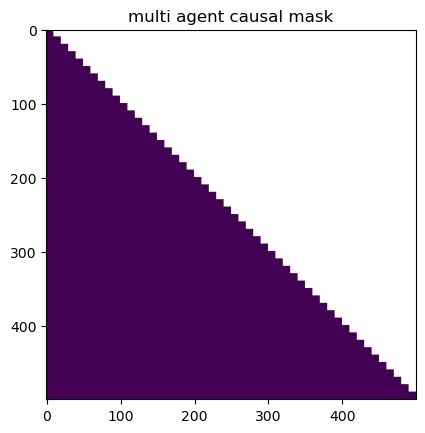

In [200]:
plt.imshow(tm.causal_mask)
plt.title('multi agent causal mask')